<a href="https://colab.research.google.com/github/Rohan-1103/Data-Science/blob/main/LogisticRegression_perceptron_trick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Logistic Regression Perceptron trick

In [1]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

In [2]:
import matplotlib.pyplot as plt

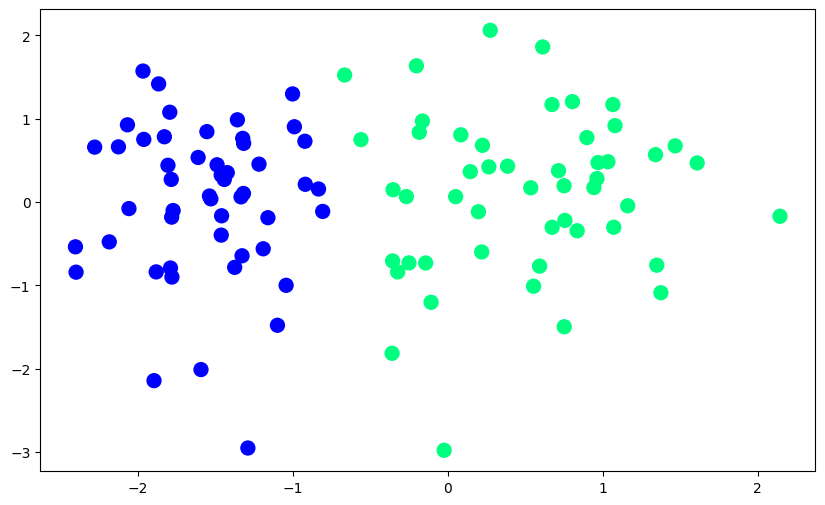

In [3]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

In [4]:
def step(z):
    return 1 if z>0 else 0

In [5]:
def perceptron(X,y):
    # bias term addtion in x
    X = np.insert(X,0,1,axis=1)
    # weights
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(1000):
        # j is random point
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        # 0 -> interscept and 1 -> coef
    return weights[0],weights[1:]


In [6]:
intercept_,coef_ = perceptron(X,y)

In [7]:
print(coef_)
print(intercept_)

[1.31233131 0.09456066]
1.0


In [8]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [9]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

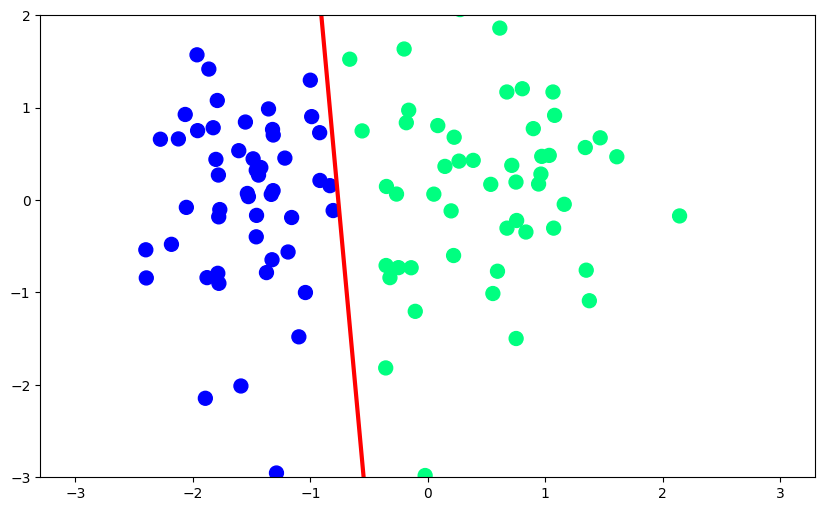

In [10]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [11]:
def perceptron(X,y):

    m = []
    b = []

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))

    return m,b

In [12]:
m,b = perceptron(X,y)

In [13]:
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [14]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML # Import HTML for displaying animation

# Call the perceptron function to get lists of m and b
m, b = perceptron(X,y) # This ensures m and b are lists for this cell

fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)

# initial line, using the first values from the lists m and b
line, = ax.plot(x_i, x_i*m[0] + b[0], 'r-', linewidth=2)

# scatter plot of your dataset
ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100, edgecolor='k')

plt.ylim(-3,3)

def update(i):
    label = f'epoch {i+1}'
    line.set_ydata(x_i*m[i] + b[i])   # update line with slope/intercept at epoch i
    ax.set_xlabel(label)              # update label
    return line,

# number of frames = length of m (and b)
anim = FuncAnimation(fig, update, frames=len(m), interval=100, repeat=True)

# Display the animation in the notebook using HTML
# You can also save it if needed:
# anim.save("animation.mp4", writer="ffmpeg")

display(HTML(anim.to_jshtml()))

# Explicitly stop the animation's event source before closing the figure
# This often prevents the 'NoneType' object has no attribute 'remove_callback' error
if anim.event_source is not None:
    anim.event_source.stop()

# Explicitly clear the animation object and close the figure to prevent conflicts
anim = None
plt.close(fig)

In [15]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

LogisticRegression()

In [16]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [17]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

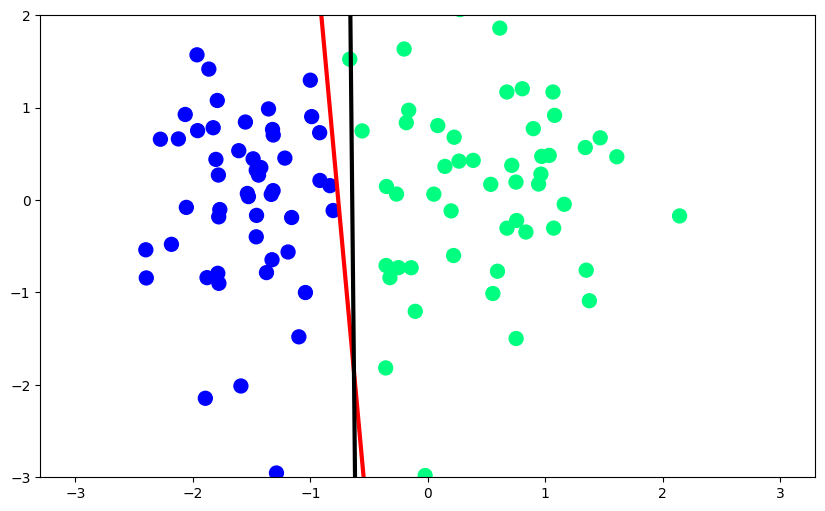

In [18]:
# import matplotlib.pyplot as plt
# plt.close('all') # Close all existing figures to ensure a clean slate
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
plt.show()

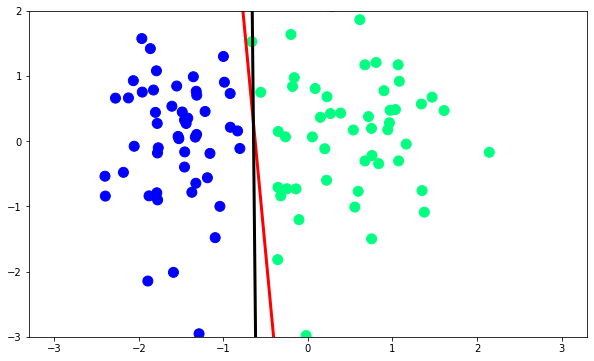